# Implement TimeSeriesWeihai.pdf in python
## State-Space models and the Kalman filter
### generate State Space model

In [1]:
import numpy as np

def StateSpaceGen(sigmae, sigmau, z, w, const, n):
    y = []
    alpha = []
    e = np.sqrt(sigmae) * np.random.randn(n)
    u = np.sqrt(sigmau) * np.random.randn(n)
    y.append(e[0])
    alpha.append(u[0])
    for i in range(1, n):
        y.append(z * alpha[i - 1] + e[i])
        alpha.append(const + w * alpha[i - 1] + u[i])
    return y, alpha

In [2]:
np.random.seed(1233)
y, alpha = StateSpaceGen(0.5, 0.1, 1, 0.8, 0.3, 100)

### plot State Space model

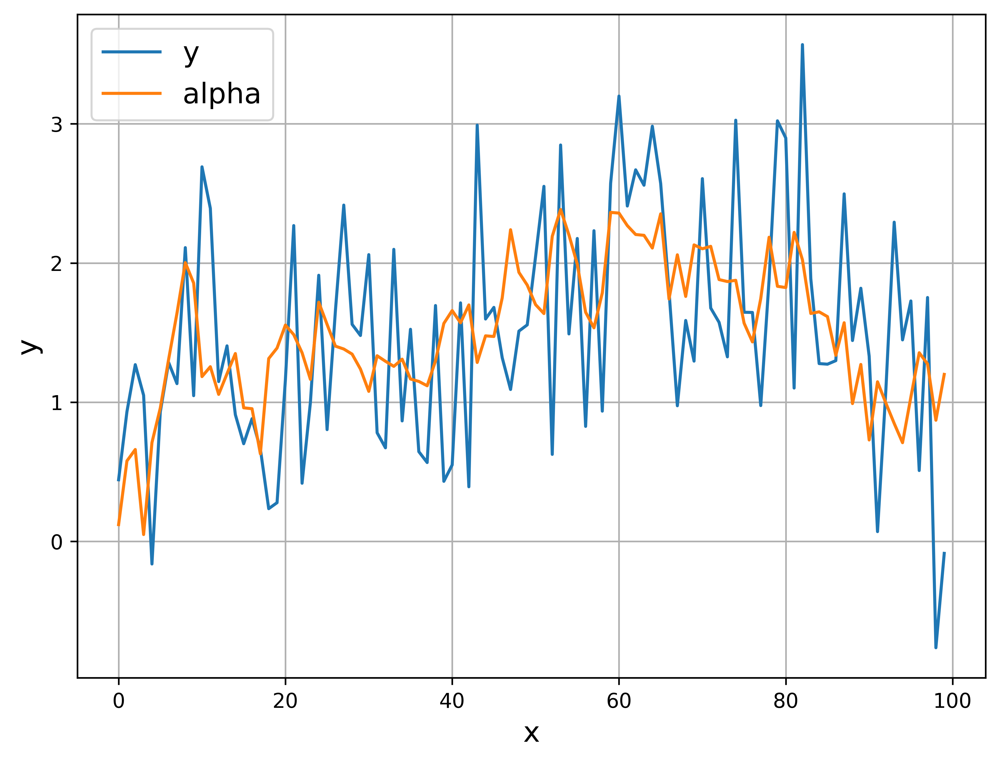

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y)
plt.plot(alpha)
plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.legend(['y', 'alpha'], fontsize=14)
plt.grid()
plt.show()

### kalman filter

In [4]:
def KF(sigmae, sigmau, z, w, const, y):
    n = len(y)
    a = []
    p = []
    k = []
    v = []
    a.append(y[0])
    p.append(10000)
    k.append(0)
    v.append(0)
    if w < 1:
        a[0] = 0
        p[0] = sigmau / (1 - np.sqrt(w))
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + sigmae))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + sigmau)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
    return a

In [5]:
np.random.seed(314)
y, alpha = StateSpaceGen(0.5, 0.1, 1, 0.8, 0.3, 100)
a = KF(0.5, 0.1, 1, 0.8, 0.3, y)

### plot state space model with kalman filter

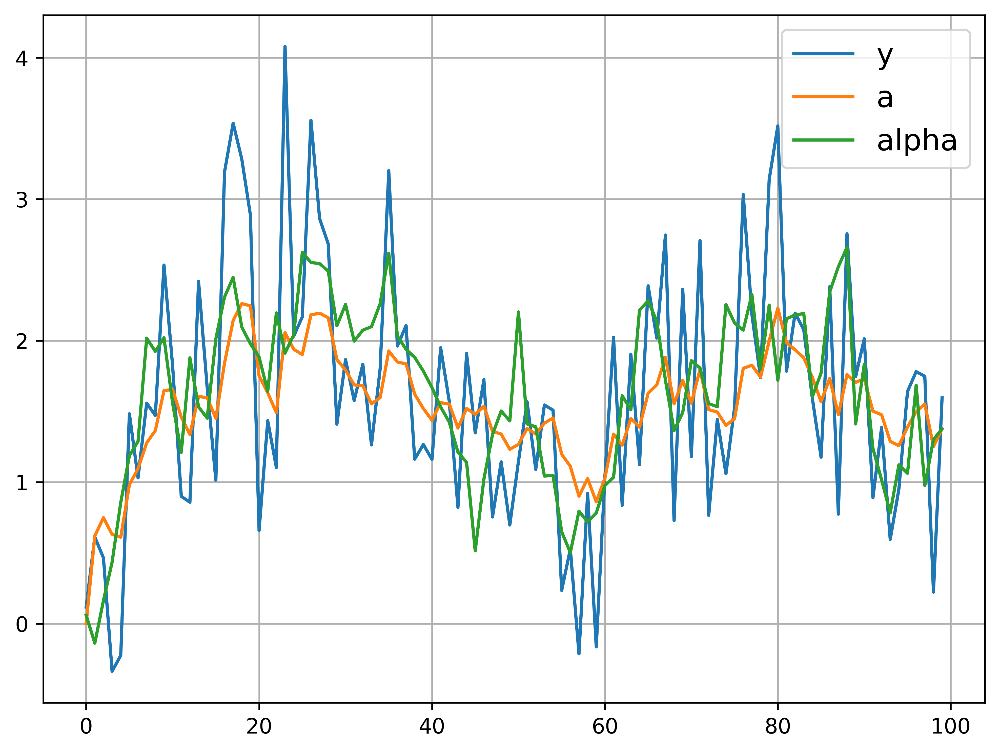

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(a, label="a")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameters

In [7]:
def Log_Like_SS(params, y):
    sigmae = abs(params[0])
    sigmau = abs(params[1])
    w = abs(params[2])
    const = abs(params[3])
    z = 1
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    likelihood = 0
    if w < 1:
        a[0] = 0
        p[0] = sigmau / (1 - np.sqrt(w))
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + sigmae))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + sigmau)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 * np.log(pow(
            z, 2) * p[t - 1] + sigmae) + 0.5 * (pow(v[t], 2) / (pow(z, 2) * p[t - 1] + sigmae))
    return likelihood

#### LogLikeSS

In [22]:
import pandas as pd
from scipy.optimize import minimize

np.random.seed(444)
y, alpha = StateSpaceGen(0.85, 0.5, 1, 0.3, 0.3, 12000)
sigmae = 0.85
sigmau = 0.5
w = 0.3
const = 0.3
params_Log_Like_SS = [sigmae, sigmau, w, const]
result_Log_Like_SS = minimize(fun = Log_Like_SS, x0 = params_Log_Like_SS, args = y, method = 'Nelder-Mead')
print(result_Log_Like_SS)

output_Estmate = pd.Series()
output_Estmate['sigmae'] = abs(result_Log_Like_SS.x[0])
output_Estmate['sigmau'] = abs(result_Log_Like_SS.x[1])
output_Estmate['w'] = abs(result_Log_Like_SS.x[2])
output_Estmate['const'] = abs(result_Log_Like_SS.x[3])

output_True = pd.Series()
output_True['sigmae'] = 0.85
output_True['sigmau'] = 0.5
output_True['w'] = 0.3
output_True['const'] = 0.3

output = pd.DataFrame()
output['Estimate Params'] = output_Estmate
output['Ture Params'] = output_True
output

 final_simplex: (array([[0.80016561, 0.57257628, 0.30344989, 0.28746792],
       [0.80024072, 0.57250253, 0.30347196, 0.28745619],
       [0.80021509, 0.57252066, 0.303474  , 0.28746118],
       [0.8002226 , 0.57252839, 0.30346759, 0.28746078],
       [0.80024514, 0.57249131, 0.3034842 , 0.28744822]]), array([19063.72060362, 19063.72060368, 19063.72060369, 19063.7206038 ,
       19063.7206038 ]))
           fun: 19063.720603622372
       message: 'Optimization terminated successfully.'
          nfev: 172
           nit: 98
        status: 0
       success: True
             x: array([0.80016561, 0.57257628, 0.30344989, 0.28746792])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:20: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Params,Ture Params
sigmae,0.800166,0.85
sigmau,0.572576,0.50
w,0.303450,0.30
const,0.287468,0.30


#### LogLikeSSconc

In [16]:
def Log_Like_SSconc(params, y):
    q = abs(params[0])
    w = abs(params[1])
    const = abs(params[2])
    z = 1
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    likelihood = 0
    sigmae = 0.000001
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + 1))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        sigmae += pow(v[t], 2) / (pow(z, 2) * p[t - 1] + 1)
        likelihood += 0.5 * np.log(2 * np.pi) + + \
            0.5 + 0.5 * np.log(pow(z, 2) * p[t - 1] + 1)
    likelihood += 0.5 * n * np.log(sigmae / n)
    return likelihood

In [23]:
np.random.seed(123)
y, alpha = StateSpaceGen(0.5, 0.1, 1, 0.8, 0.3, 12000)
q = 0.04
w = 0.8
const = 0.3
params_Log_Like_SSconc = [q, w, const]
res_Log_Like_SSconc = minimize(fun = Log_Like_SSconc,x0 = params_Log_Like_SSconc, args = y, method = 'Nelder-Mead')
print(res_Log_Like_SSconc)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_Log_Like_SSconc.x[0])
output_Estmate['w'] = abs(res_Log_Like_SSconc.x[1])
output_Estmate['const'] = abs(res_Log_Like_SSconc.x[2])

output_True = pd.Series()
output_True['q'] = 0.2
output_True['w'] = 0.8
output_True['const'] = 0.3

output = pd.DataFrame()
output['Estimate Params'] = output_Estmate
output['Ture Params'] = output_True
output

 final_simplex: (array([[0.20679793, 0.80592369, 0.29292901],
       [0.20676188, 0.80595735, 0.2928744 ],
       [0.20680778, 0.80591211, 0.29293995],
       [0.20687372, 0.80591782, 0.29294389]]), array([14714.11847736, 14714.11848092, 14714.11848117, 14714.11848274]))
           fun: 14714.118477360456
       message: 'Optimization terminated successfully.'
          nfev: 140
           nit: 77
        status: 0
       success: True
             x: array([0.20679793, 0.80592369, 0.29292901])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  from ipykernel import kernelapp as app


,Estimate Params,Ture Params
q,0.206798,0.2
w,0.805924,0.8
const,0.292929,0.3


## The Local level model (or simple exponential smoothing)
### generate the model

In [18]:
import numpy as np
np.random.seed(153)
y, alpha = StateSpaceGen(0.5, 0.2, 1, 1, 0, 100)

### plot the model

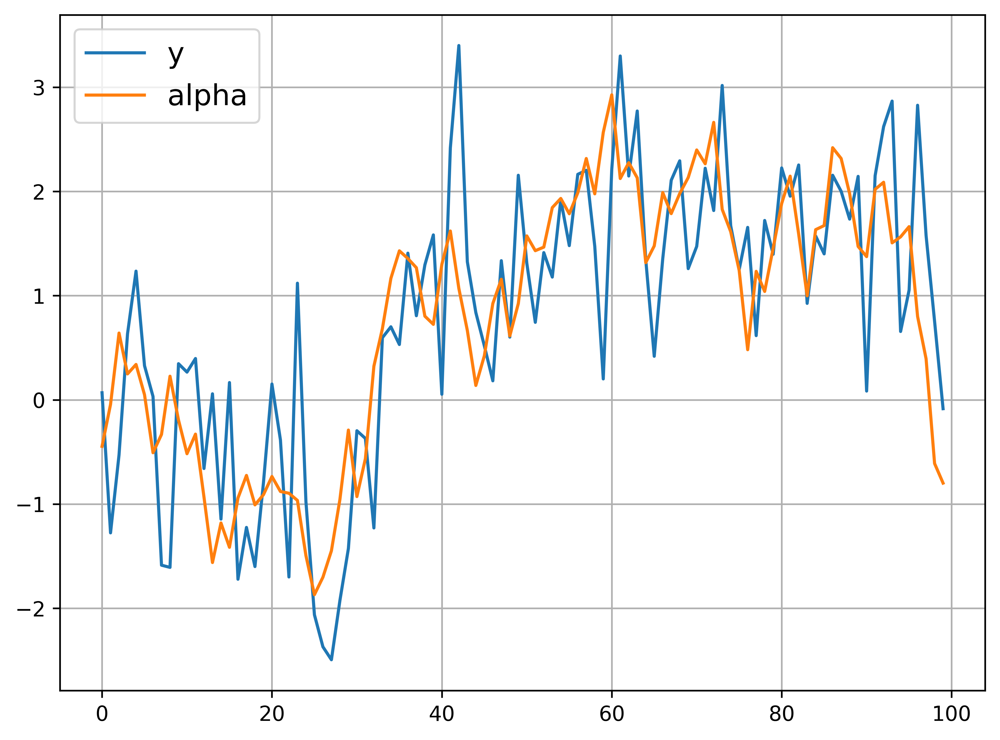

In [19]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameter
#### LikeExpSmooth

In [20]:
def Like_Exp_Smooth(params, y):
    sigmae = abs(params[0])
    sigmau = abs(params[1])
    w = 1
    const = 0
    z = 1
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    likelihood = 0
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + sigmae))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + sigmau)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 * np.log(pow(
            z, 2) * p[t - 1] + sigmae) + 0.5 * (pow(v[t], 2) / (pow(z, 2) * p[t - 1] + sigmae))
    return likelihood

In [24]:
np.random.seed(153)
y, alpha = StateSpaceGen(0.5, 0.2, 1, 1, 0, 10000)
sigmae = 0.5
sigmau = 0.2
params = [sigmae, sigmau]
res_Like_Exp_Smooth = minimize(Like_Exp_Smooth, params, y, method='Nelder-Mead')
print(res_Like_Exp_Smooth)

output_Estmate = pd.Series()
output_Estmate['sigmae'] = abs(res_Like_Exp_Smooth.x[0])
output_Estmate['sigmau'] = abs(res_Like_Exp_Smooth.x[1])

output_True = pd.Series()
output_True['sigmae'] = 0.5
output_True['sigmau'] = 0.2

output = pd.DataFrame()
output['Estimate Params'] = output_Estmate
output['Ture Params'] = output_True
output

 final_simplex: (array([[0.50041998, 0.1887327 ],
       [0.5004802 , 0.18871827],
       [0.50036464, 0.18880931]]), array([13755.27301061, 13755.27302624, 13755.27303278]))
           fun: 13755.273010608671
       message: 'Optimization terminated successfully.'
          nfev: 40
           nit: 20
        status: 0
       success: True
             x: array([0.50041998, 0.1887327 ])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  del sys.path[0]


,Estimate Params,Ture Params
sigmae,0.500420,0.5
sigmau,0.188733,0.2


#### LikeExpSmoothConc

In [25]:
def Like_Exp_Smooth_Conc(params,y):
    q = abs(params[0])
    w = 1
    const = 0
    z = 1
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    likelihood = 0
    sigmae = 0.000001
    for t in range(1,n):
        k.append((z*w*p[t-1])/(pow(z,2)*p[t-1]+1))
        p.append(pow(w,2)*p[t-1]-w*z*k[t]*p[t-1]+q)
        v.append(y[t]-z*a[t-1])
        a.append(const+w*a[t-1]+k[t]*v[t])
        sigmae+=pow(v[t],2)/(pow(z,2)*p[t-1]+1)
        likelihood +=0.5*np.log(2*np.pi)+0.5+0.5*np.log(pow(z,2)*p[t-1]+1)
    likelihood +=0.5*n*np.log(sigmae/n)
    return likelihood

In [26]:
np.random.seed(153)
y, alpha = StateSpaceGen(0.5, 0.2, 1, 1, 0, 10000)
q = 0.4
res_Like_Exp_Smooth_Conc = minimize(Like_Exp_Smooth_Conc, q, y, method = 'Nelder-Mead')
print(res_Like_Exp_Smooth_Conc)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_Like_Exp_Smooth_Conc.x[0])

output_True = pd.Series()
output_True['q'] = 0.4

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.3775    ],
       [0.37742188]]), array([13754.08049069, 13754.08049818]))
           fun: 13754.080490694107
       message: 'Optimization terminated successfully.'
          nfev: 20
           nit: 10
        status: 0
       success: True
             x: array([0.3775])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.


,Estimate Param,Ture Param
q,0.3775,0.4


## Exercise: (Auto)regression with time varying parameter

In [27]:
import numpy as np

np.random.seed(234)
n = 100
e = np.sqrt(0.5) * np.random.randn(n)
u = np.sqrt(0.02) * np.random.randn(n)
y = [e[0]]
alpha = [u[0] + 0.75]
for t in range(1, n):
    z = y[t - 1]
    y.append(z * alpha[t - 1] + e[t])
    alpha.append(alpha[t - 1] + u[t])

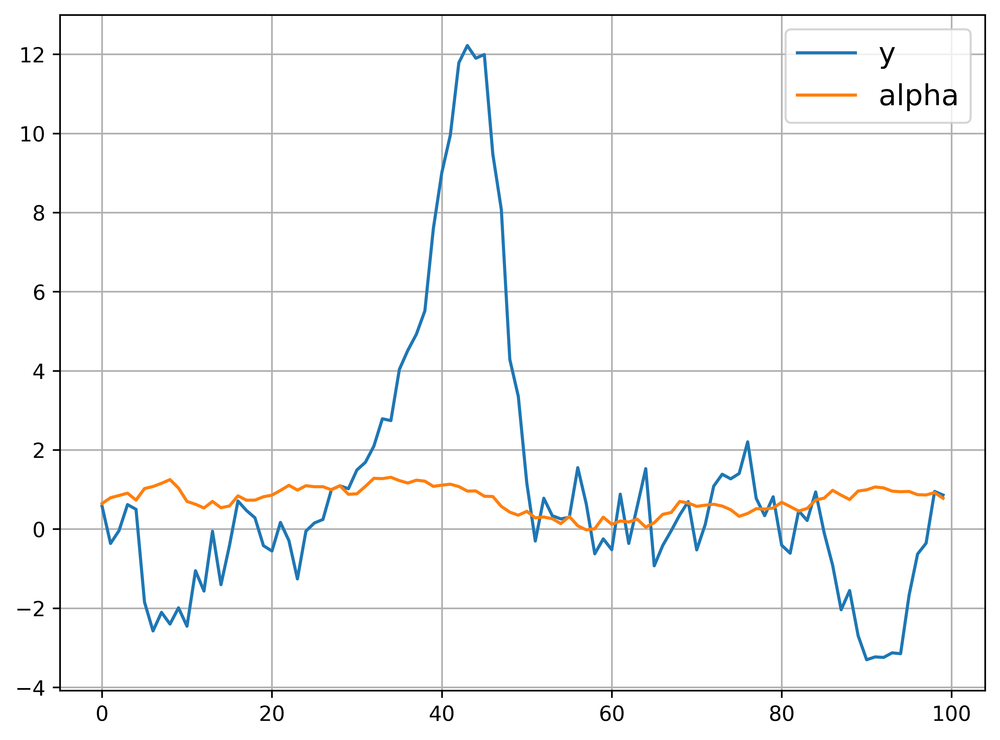

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate params

In [29]:
def Like_AR1_TV(params, y):
    w = 1
    k = [0]
    v = [0]
    const = 0
    n = len(y)
    a = [y[0]]
    p = [10000]
    likelihood = 0
    sigmae = abs(params[0])
    sigmau = abs(params[1])
    for t in range(1, n):
        z = y[t - 1]
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + sigmae))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + sigmau)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 * np.log(pow(
            z, 2) * p[t - 1] + sigmae) + 0.5 * (pow(v[t], 2) / (pow(z, 2) * p[t - 1] + sigmae))
    return likelihood

In [36]:
import numpy as np

np.random.seed(234)
n = 500
e = np.sqrt(0.5) * np.random.randn(n)
u = np.sqrt(0.02) * np.random.randn(n)
y = [e[0]]
alpha = [0.65 + u[0]]
for t in range(1, n):
    z = y[t - 1]
    y.append(z * alpha[t - 1] + e[t])
    alpha.append(alpha[t - 1] + u[t])

In [37]:
import pandas as pd
from scipy.optimize import minimize

sigmae = 0.5
sigmau = 0.02
params = [sigmae,sigmau]
res_Like_AR1_TV = minimize(Like_AR1_TV, x0 = params,args = y, method='Nelder-Mead')
print(res_Like_AR1_TV)

output_Estmate = pd.Series()
output_Estmate['sigmae'] = abs(res_Like_AR1_TV.x[0])
output_Estmate['sigmau'] = abs(res_Like_AR1_TV.x[1])

output_True = pd.Series()
output_True['sigmae'] = 0.5
output_True['sigmau'] = 0.02

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.50192621, 0.0218504 ],
       [0.50185433, 0.02185231],
       [0.5018768 , 0.02185702]]), array([2693.64893925, 2693.64893951, 2693.6489408 ]))
           fun: 2693.6489392485164
       message: 'Optimization terminated successfully.'
          nfev: 40
           nit: 21
        status: 0
       success: True
             x: array([0.50192621, 0.0218504 ])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  


,Estimate Param,Ture Param
sigmae,0.501926,0.50
sigmau,0.021850,0.02


In [38]:
def Like_AR1_TV_Conc(params, y):
    w = 1
    k = [0]
    v = [0]
    const = 0
    p = [10000]
    n = len(y)
    a = [y[0]]
    likelihood = 0
    sigmae = 0.000001
    q = abs(params[0])
    for t in range(1, n):
        z = y[t - 1]
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + 1))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        sigmae += pow(v[t], 2) / (pow(z, 2) * p[t - 1] + 1)
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
            0.5 * np.log(pow(z, 2) * p[t - 1] + 1)
    likelihood += 0.5 * n * np.log(sigmae / n)
    return likelihood

In [39]:
q = 0.04
param = q
res_Like_AR1_TV_Conc = minimize(Like_AR1_TV_Conc, param, y, method='Nelder-Mead')
print(res_Like_AR1_TV_Conc)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_Like_AR1_TV_Conc.x[0])

output_True = pd.Series()
output_True['q'] = 0.04

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.043875 ],
       [0.0438125]]), array([2692.45647909, 2692.45650101]))
           fun: 2692.456479094329
       message: 'Optimization terminated successfully.'
          nfev: 14
           nit: 7
        status: 0
       success: True
             x: array([0.043875])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':


,Estimate Param,Ture Param
q,0.043875,0.04


## The Local Level with drift: (the Theta method)
### generate the series

In [40]:
import numpy as np

def StateSpaceGen(sigmae, sigmau, z, w, const, n):
    y = []
    alpha = []
    e = np.sqrt(sigmae) * np.random.randn(n)
    u = np.sqrt(sigmau) * np.random.randn(n)
    y.append(e[0])
    alpha.append(u[0])
    for i in range(1, n):
        y.append(z * alpha[i - 1] + e[i])
        alpha.append(const + w * alpha[i - 1] + u[i])
    return y, alpha

np.random.seed(572)
sigmae = 0.8
sigmau = 0.1
z = 1
w = 1
const = 0.1
n = 100
y,alpha = StateSpaceGen(sigmae, sigmau, z, w, const, n)

### plot series

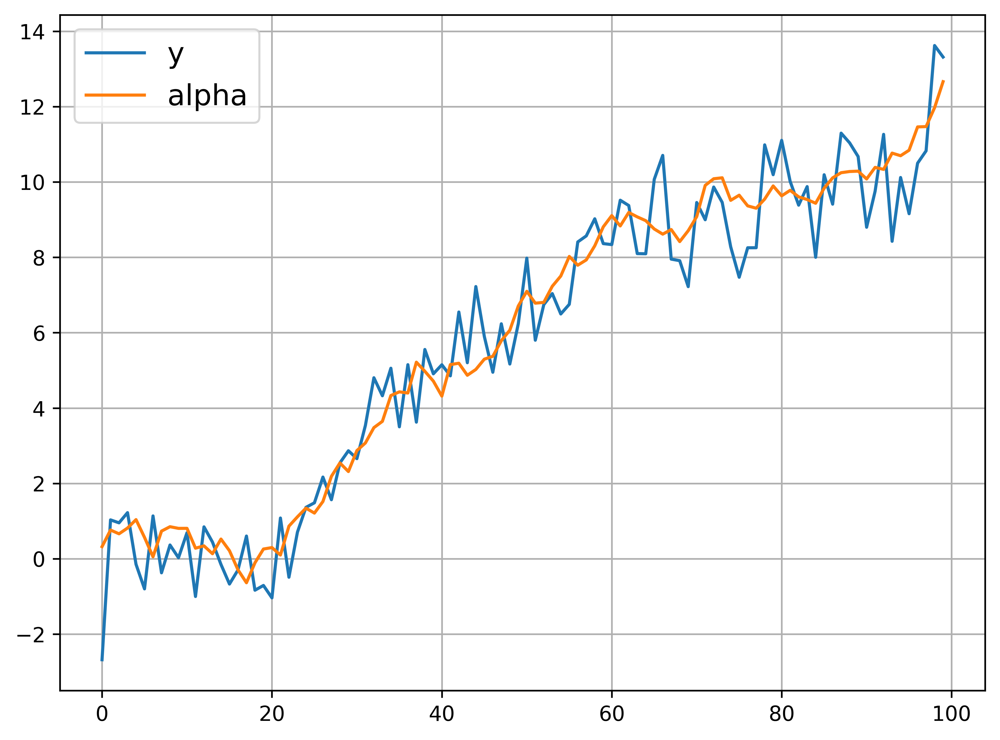

In [41]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameters
#### LikeTheta

In [42]:
def Like_Theta(params, y):
    sigmae = abs(params[0])
    sigmau = abs(params[1])
    const = abs(params[2])
    w = 1
    z = 1
    k = [0]
    v = [0]
    n = len(y)
    a = [y[0]]
    p = [10000]
    likelihood = 0
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + sigmae))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + sigmau)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 * np.log(pow(
            z, 2) * p[t - 1] + sigmae) + 0.5 * (pow(v[t], 2) / (pow(z, 2) * p[t - 1] + sigmae))
    return likelihood

In [43]:
import pandas as pd
from scipy.optimize import minimize

np.random.seed(572)
y,alpha = StateSpaceGen(0.8, 0.1, 1, 1, 0.1, 10000)
sigmae = 0.8
sigmau = 0.1
const = 0.1
params = [sigmae, sigmau, const]
res_Like_Theta = minimize(Like_Theta, params, y)
print(res_Like_Theta)

output_Estmate = pd.Series()
output_Estmate['sigmae'] = abs(res_Like_Theta.x[0])
output_Estmate['sigmau'] = abs(res_Like_Theta.x[1])
output_Estmate['const'] = abs(res_Like_Theta.x[2])

output_True = pd.Series()
output_True['sigmae'] = 0.8
output_True['sigmau'] = 0.1
output_True['const'] = 0.1

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

      fun: 14797.558118956182
 hess_inv: array([[ 6.83021341e-06, -7.31435484e-06, -5.36472532e-06],
       [-7.31435484e-06,  7.84094189e-06,  5.74905314e-06],
       [-5.36472532e-06,  5.74905314e-06,  4.21570583e-06]])
      jac: array([0.0057373 , 0.00292969, 0.0032959 ])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 200
      nit: 13
     njev: 50
   status: 2
  success: False
        x: array([0.78849465, 0.10253551, 0.10980417])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  del sys.path[0]
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:18: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
sigmae,0.788495,0.8
sigmau,0.102536,0.1
const,0.109804,0.1


#### LikeThetaConc

In [44]:
def Like_Theta_Conc(params, y):
    q = abs(params[0])
    const = abs(params[1])
    w = 1
    z = 1
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    likelihood = 0
    sigmae = 0
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (pow(z, 2) * p[t - 1] + 1))
        p.append(pow(w, 2) * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(y[t] - z * a[t - 1])
        a.append(const + w * a[t - 1] + k[t] * v[t])
        sigmae += pow(v[t], 2) / (pow(z, 2) * p[t - 1] + 1)
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
            0.5 * np.log(abs(z * z * p[t - 1] + 1))
    likelihood += 0.5 * n * np.log(sigmae / n)
    return likelihood

In [45]:
np.random.seed(572)
y,alpha = StateSpaceGen(0.8, 0.1, 1, 1, 0.1, 10000)
q = 1/64
const = 0.1
params = [q,const]
res_Like_Theta_Conc = minimize(Like_Theta_Conc, params, y, method = 'Nelder-Mead')
print(res_Like_Theta_Conc)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_Like_Theta_Conc.x[0])
output_Estmate['const'] = abs(res_Like_Theta_Conc.x[1])

output_True = pd.Series()
output_True['q'] = 1/64
output_True['const'] = 0.1

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.13012068, 0.10981206],
       [0.13018308, 0.10980043],
       [0.13014979, 0.10977607]]), array([14796.82041949, 14796.82045237, 14796.82046294]))
           fun: 14796.820419486041
       message: 'Optimization terminated successfully.'
          nfev: 66
           nit: 34
        status: 0
       success: True
             x: array([0.13012068, 0.10981206])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  del sys.path[0]


,Estimate Param,Ture Param
q,0.130121,0.015625
const,0.109812,0.100000


# Single Source of Error approach
## The exponential smoothing with one source of error

### generate series

In [57]:
import numpy as np

np.random.seed(213)
n = 100
sigmae = np.sqrt(0.6) * np.random.randn(n)
gamma = 0.3
y = [sigmae[0]]
alpha = [sigmae[0]]
for t in range(1, n):
    y.append(alpha[t-1] + sigmae[t])
    alpha.append(alpha[t-1] + gamma * sigmae[t])

### plot series

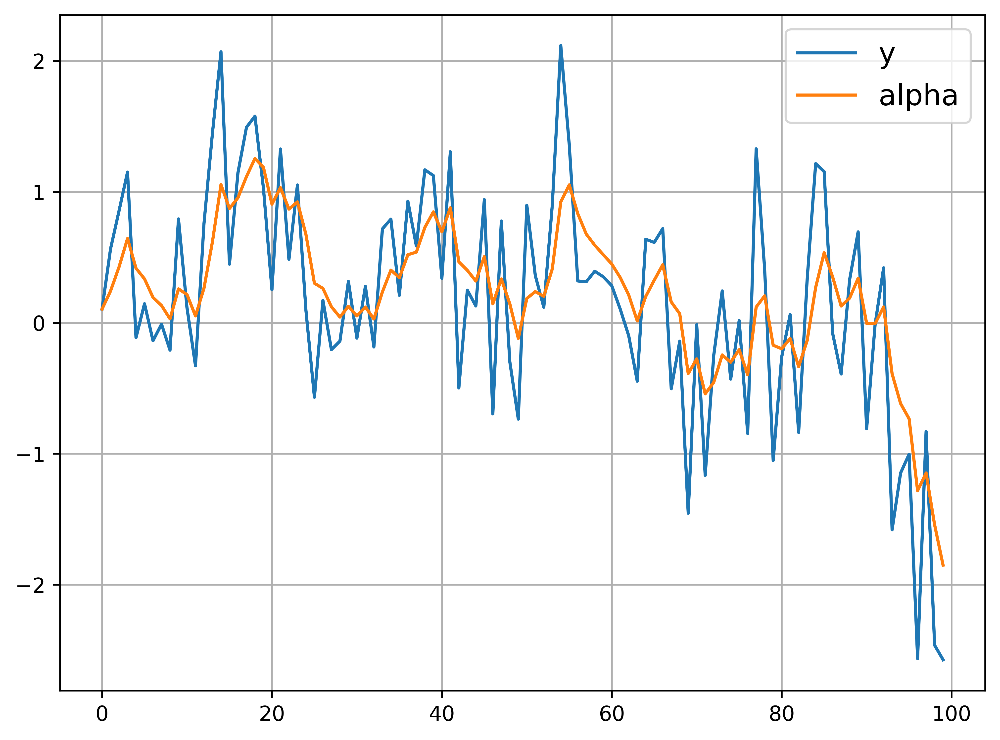

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameters

In [48]:
def Exp_Smooth_Single(params,y):
    gamma = abs(params[0])
    n = len(y)
    z = 1
    e = [0]
    a = [y[0]]
    result = 0
    for t in range(1, n):
        e.append(y[t] - z * a[t - 1])
        a.append(a[t - 1] + gamma * e[t])
        result += e[t] * e[t]
    return result / n

In [59]:
import pandas as pd
from scipy.optimize import minimize

gamma = 0.3
params = gamma
res_Exp_Smooth_Single = minimize(Exp_Smooth_Single, gamma, y, method = 'Nelder-Mead')
print(res_Exp_Smooth_Single)

output_Estmate = pd.Series()
output_Estmate['gamma'] = abs(res_Exp_Smooth_Single.x[0])

output_True = pd.Series()
output_True['gamma'] = 0.3

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.36216797],
       [0.36222656]]), array([0.53149779, 0.5314978 ]))
           fun: 0.5314977949761004
       message: 'Optimization terminated successfully.'
          nfev: 24
           nit: 12
        status: 0
       success: True
             x: array([0.36216797])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if sys.path[0] == '':


,Estimate Param,Ture Param
gamma,0.362168,0.3


## The Theta method with one source of error
### generate the model

In [60]:
import numpy as np

np.random.seed(5)
n = 100
sigmae = np.sqrt(0.5)*np.random.randn(n)
gamma = 0.1
const = 0.05
y = [sigmae[0]]
alpha = [sigmae[0]]
for t in range(1, n):
    y.append(alpha[t - 1] + sigmae[t])
    alpha.append(const + alpha[t - 1] + gamma * sigmae[t])

### plot the model

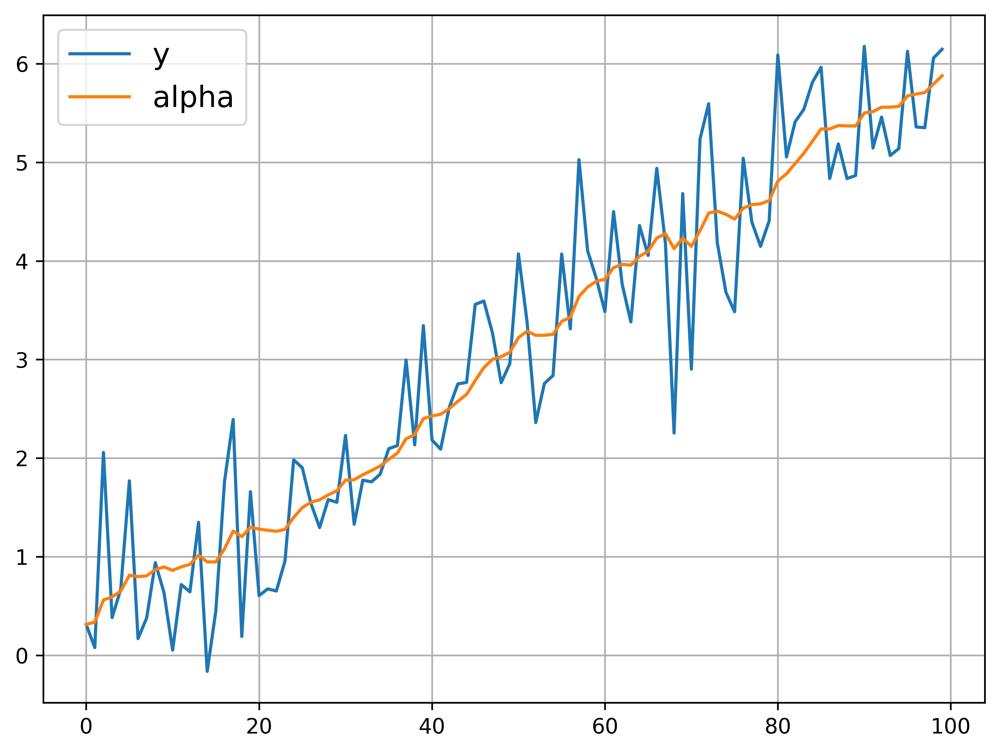

In [61]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameter

In [62]:
def Theta_Single_source_error(params,y):
    n = len(y)
    z = 1
    e = [0]
    a = [y[0]]
    result = 0
    gamma = abs(params[0])
    for t in range(1,n):
        e.append(y[t]-z*a[t-1])
        a.append(a[t-1]+gamma*e[t])
        result+=(y[t]-z*a[t-1])**2
    return result/n
gamma = np.array([0.5])

In [63]:
import pandas as pd
from scipy.optimize import minimize

gamma = 0.3
param = gamma
res_Theta_Single_source_error = minimize(Theta_Single_source_error, param, y, method = 'Nelder-Mead')
print(res_Theta_Single_source_error)

output_Estmate = pd.Series()
output_Estmate['gamma'] = abs(res_Theta_Single_source_error.x[0])

output_True = pd.Series()
output_True['gamma'] = 0.3

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.27082031],
       [0.27076172]]), array([0.51467015, 0.51467015]))
           fun: 0.5146701487177444
       message: 'Optimization terminated successfully.'
          nfev: 22
           nit: 11
        status: 0
       success: True
             x: array([0.27082031])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if sys.path[0] == '':


,Estimate Param,Ture Param
gamma,0.27082,0.3


## Damped trend model with one source of error

In [77]:
import numpy as np

np.random.seed(66)
n = 100
sigmae = np.sqrt(0.5) * np.random.randn(n)
gamma = 0.6
theta = 0.2
phi = 0.93
y = [sigmae[0]]
alpha = [sigmae[0]]
beta = [0]
for t in range(1, n):
    beta.append(phi * beta[t - 1] + theta * sigmae[t])
    alpha.append(alpha[t - 1] + phi * beta[t - 1] + gamma * sigmae[t])
    y.append(alpha[t - 1] + phi * beta[t - 1] + sigmae[t])

### plot the model

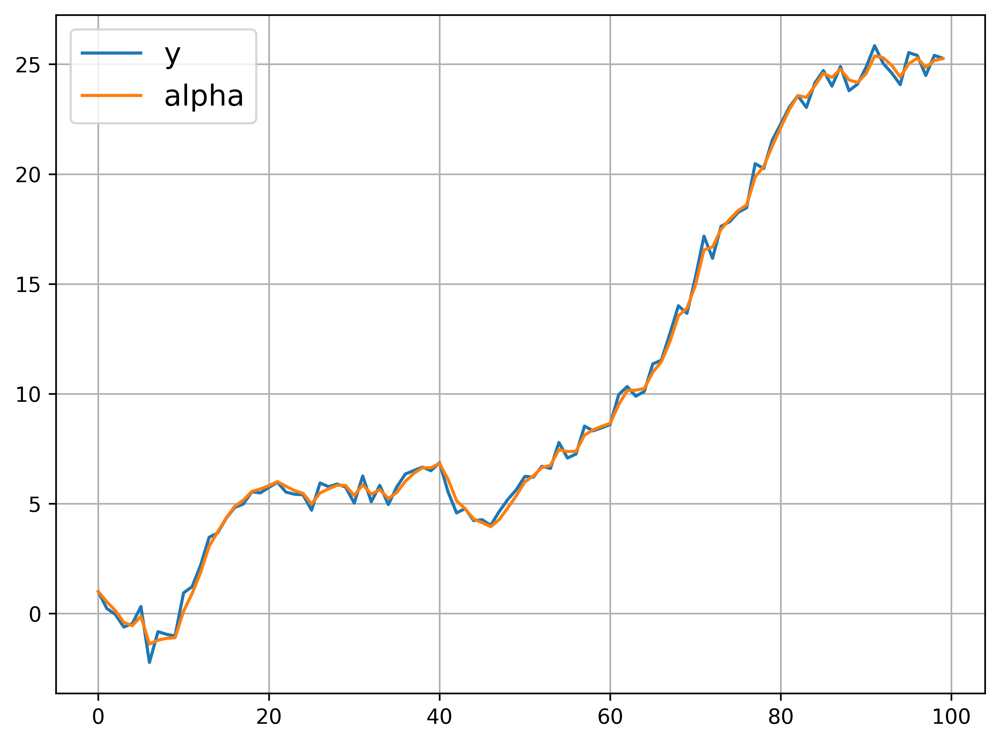

In [65]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### estimate parameter

In [71]:
def Damped_Single_source_error(params,y):
    n = len(y)
    a = [y[0]]
    b = [0]
    e = [0] #zero means null here
    gamma = abs(params[0])
    theta = abs(params[1])
    phi = abs(params[2])
    result = 0
    for t in range(1,n):
        e.append(y[t]-a[t-1]-phi*b[t-1])
        a.append(a[t-1]+phi*b[t-1]+gamma*e[t])
        b.append(phi*b[t-1]+theta*e[t])
        result +=(y[t]-a[t-1]-phi*b[t-1])**2
    return result/n

In [79]:
import pandas as pd
from scipy.optimize import minimize

np.random.seed(66)
n = 10000
sigmae = np.sqrt(0.5) * np.random.randn(n)
gamma = 0.6
theta = 0.2
phi = 0.93
y = [sigmae[0]]
alpha = [sigmae[0]]
beta = [0]
for t in range(1, n):
    beta.append(phi * beta[t - 1] + theta * sigmae[t])
    alpha.append(alpha[t - 1] + phi * beta[t - 1] + gamma * sigmae[t])
    y.append(alpha[t - 1] + phi * beta[t - 1] + sigmae[t])
params = [gamma, theta, phi]

res_Damped_Single_source_error = minimize(Damped_Single_source_error, params, y, method = 'Nelder-Mead')
print(res_Damped_Single_source_error)

output_Estmate = pd.Series()
output_Estmate['gamma'] = abs(res_Damped_Single_source_error.x[0])
output_Estmate['theta'] = abs(res_Damped_Single_source_error.x[1])
output_Estmate['phi'] = abs(res_Damped_Single_source_error.x[2])

output_True = pd.Series()
output_True['gamma'] = 0.6
output_True['theta'] = 0.2
output_True['phi'] = 0.93

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.61875797, 0.18758193, 0.93267852],
       [0.61885374, 0.18759508, 0.9326846 ],
       [0.61875421, 0.18762666, 0.93264929],
       [0.61876648, 0.18757831, 0.93265815]]), array([0.49905564, 0.49905565, 0.49905565, 0.49905565]))
           fun: 0.4990556443269297
       message: 'Optimization terminated successfully.'
          nfev: 69
           nit: 34
        status: 0
       success: True
             x: array([0.61875797, 0.18758193, 0.93267852])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
gamma,0.618758,0.60
theta,0.187582,0.20
phi,0.932679,0.93


# Seasonality
## Additive seasonality

In [80]:
import numpy as np

np.random.seed(1213)
n = 102
sigmae = np.sqrt(0.5)*np.random.randn(n)
sigmau = np.sqrt(0.1)*np.random.randn(n)
y = []
alpha = []
seasfactor = [5, -4, 2, -3]
s = 4
seasonal = []

for i in range(n):
    seasonal.append(seasfactor[i % s])
    
y.append(sigmae[0]+seasonal[0])
alpha.append(sigmau[0])

for t in range(1,n):
    y.append(seasonal[t]+alpha[t-1]+sigmae[t])
    alpha.append(alpha[t-1]+sigmau[t])

### plot series

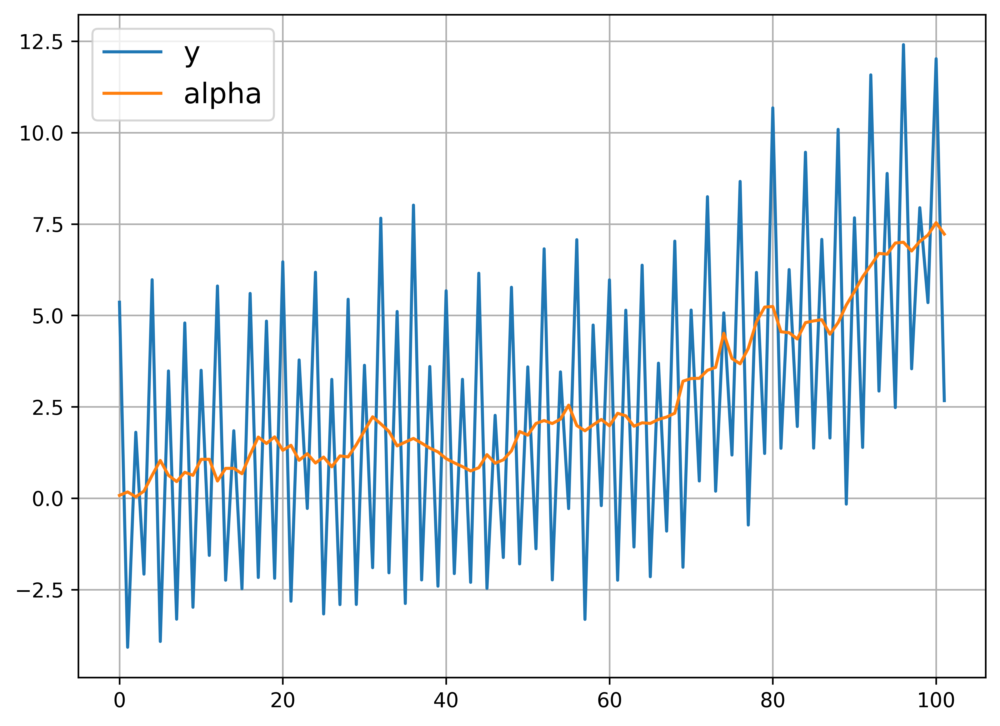

In [81]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### Subtract the CMA(centered moving average) from the original series

In [82]:
import pandas as pd
y = [6, 2, 1, 3, 7, 3, 2, 4]
cma = np.zeros(8)
cma[2] = (0.5 * y[0] + y[1] + y[2] + y[3] + 0.5 * y[4]) / 4
cma[3] = (0.5 * y[1] + y[2] + y[3] + y[4] + 0.5 * y[5]) / 4
cma[4] = (0.5 * y[2] + y[3] + y[4] + y[5] + 0.5 * y[6]) / 4
cma[5] = (0.5 * y[3] + y[4] + y[5] + y[6] + 0.5 * y[7]) / 4
residuals = y - cma

out_put = pd.DataFrame()
out_put['y'] = y
out_put['CMA'] = cma
out_put['residuals'] = residuals
out_put

,y,CMA,residuals
0,6,0.000,6.000
1,2,0.000,2.000
2,1,3.125,-2.125
3,3,3.375,-0.375
4,7,3.625,3.375
5,3,3.875,-0.875
6,2,0.000,2.000
7,4,0.000,4.000


### Average the elements of $residualst$ by season and obtain the seasonal factor

In [83]:
factors = [residuals[4], residuals[5], residuals[2], residuals[3],
           residuals[4], residuals[5], residuals[2], residuals[3]]
newseries = []
for i in range(len(factors)):
    newseries.append(y[i] - factors[i])

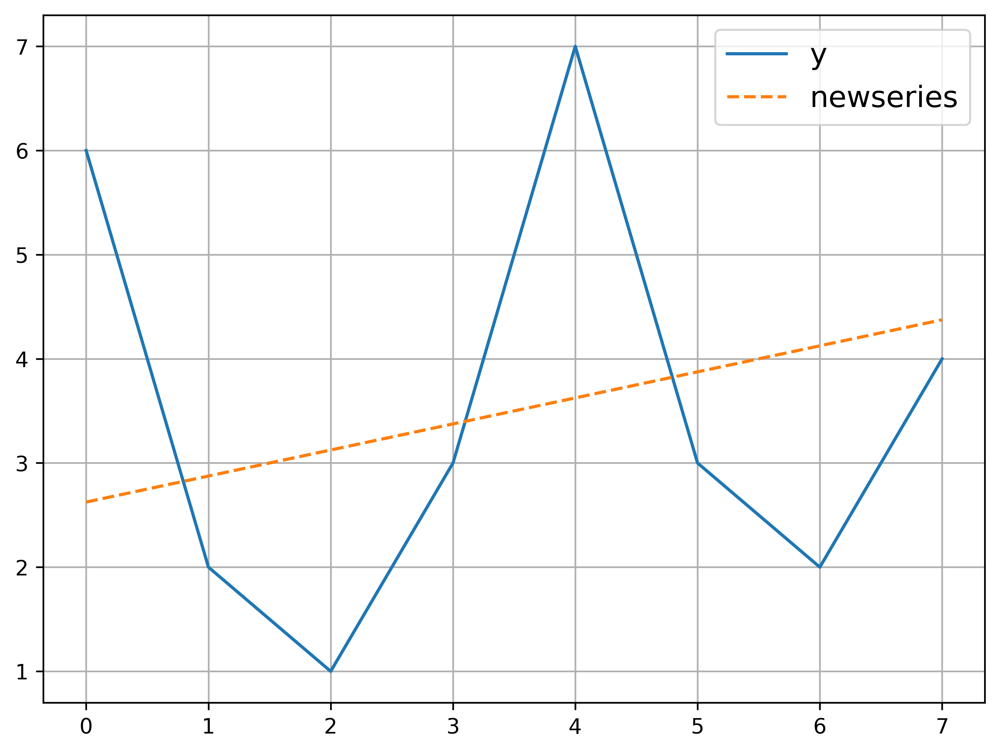

In [84]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(newseries, '--', label="newseries")
plt.legend(fontsize=14)
plt.grid()
plt.show()

### generate a series and implement the process of taking out the seasonal component

In [85]:
import numpy as np

np.random.seed(243)
n = 87
sigmae = np.sqrt(0.3) * np.random.randn(n)
sigmau = np.sqrt(0.1) * np.random.randn(n)
y = []
alpha = []
factor = [5, -4, 2, -3]
s = 4
seasonal = []

for i in range(n):
    seasonal.append(factor[i % s])

y.append(sigmae[0] + seasonal[0])
alpha.append(sigmau[0])

for t in range(1, n):
    y.append(seasonal[t] + alpha[t - 1] + sigmae[t])
    alpha.append(alpha[t - 1] + sigmau[t])

In [86]:
import pandas as pd
w = []
for i in range(s + 1):
    w.append(1 / (2 * s))
for i in range(1, s):
    w[i] = 1 / s

cma = np.zeros(len(y))

for g in range(len(y) - s):
    for i in range(s + 1):
        cma[int(g + s / 2)] += w[i] * y[g + i]

residuals = y - cma
pd.Series(residuals)

0     5.346641
1    -4.980354
2     0.894582
3    -1.961655
4     5.053341
        ...   
82    1.773388
83   -2.606990
84    5.559848
85   -4.120238
86    2.294194
Length: 87, dtype: float64

In [90]:
factors = []
for seas in range(s):
    num = seas
    temp = []
    while num < (len(y) - 1):
        if (num < 2 or num > (len(y) - 3)):
            num += 4
            continue
        else:
            temp.append(residuals[num])
            num += 4
    factors.append(np.mean(temp))
newseries = []
for i in range(n):
    newseries.append(y[i] - factors[i % s])

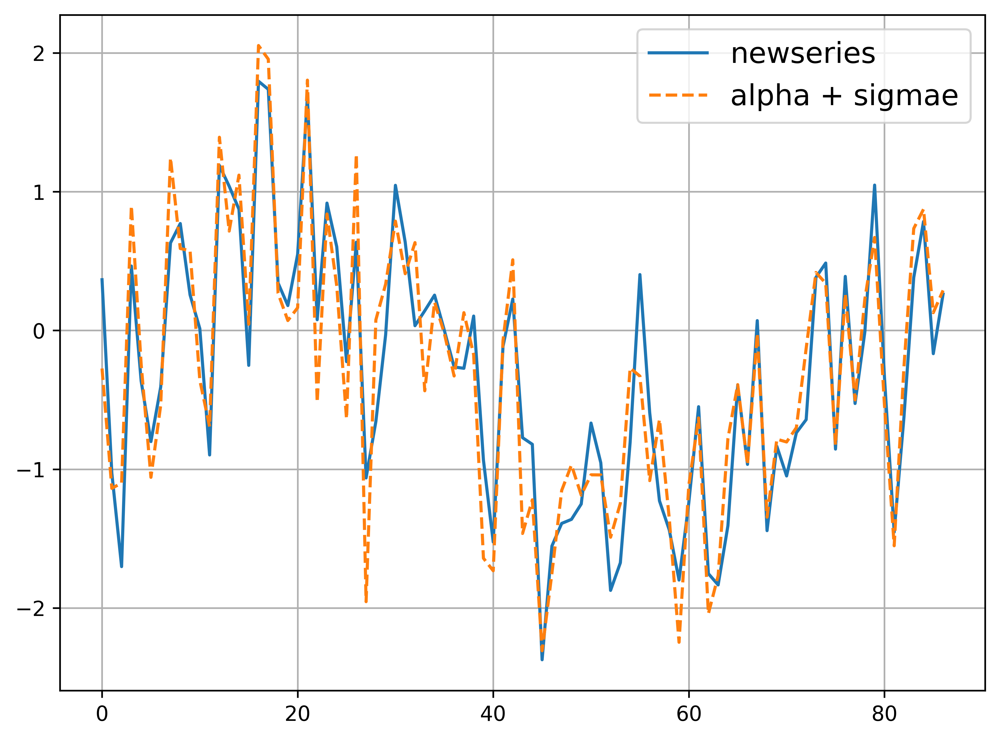

In [89]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(newseries, label="newseries")
plt.plot(alpha + sigmae, '--', label="alpha + sigmae")
plt.legend(fontsize=14)
plt.grid()
plt.show()

## multiplicative seasonality

In [91]:
import numpy as np

np.random.seed(7)
n = 103
sigmae = np.sqrt(0.5)*np.random.randn(n)
sigmau = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
factor = [1.7,0.3,1.9,0.1]
seasonal = []

for i in range(n):
    seasonal.append(factor[i%s])
y.append(sigmae[0])
alpha.append(5+sigmau[0])

for t in range(1,n):
    y.append(seasonal[t]*(alpha[t-1]+sigmae[t]))
    alpha.append(alpha[t-1]+sigmau[t])

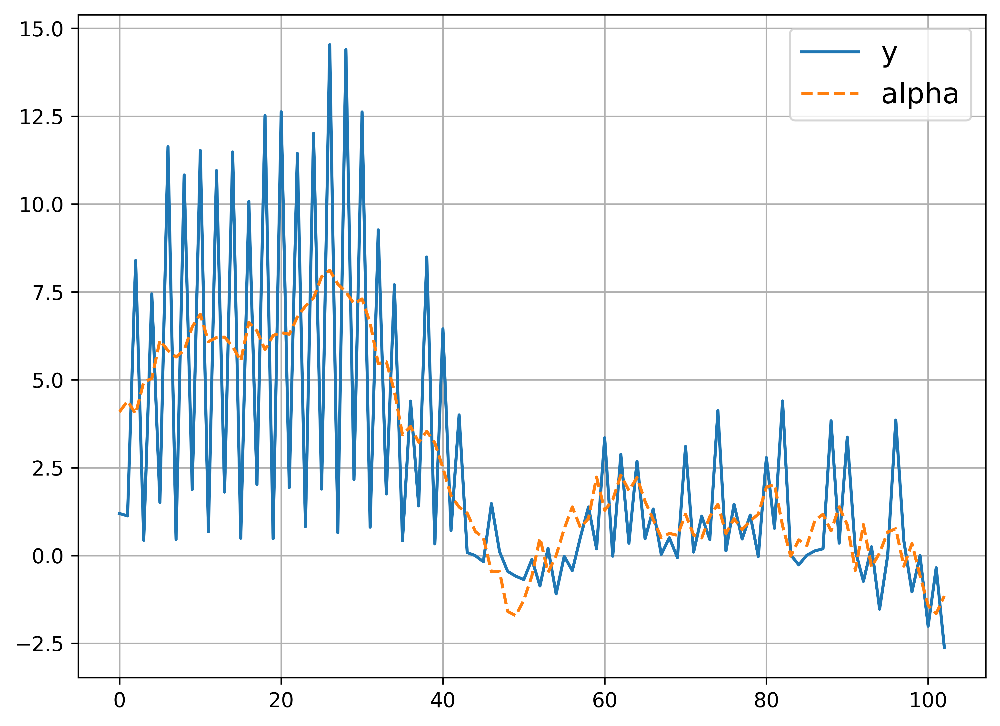

In [92]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, '--', label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

In [93]:
import numpy as np

np.random.seed(7)
n = 103
sigmae = np.sqrt(0.5)*np.random.randn(n)
sigmau = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
factor = [1.7,0.3,1.9,0.1]
seasonal = []
for i in range(n):
    seasonal.append(factor[i%s])
y.append(sigmae[0])
alpha.append(5+sigmau[0])
for t in range(1,n):
    y.append(seasonal[t]*(alpha[t-1]+sigmae[t]))
    alpha.append(alpha[t-1]+sigmau[t])
s = 4
n = len(y)
w = []
for i in range(s+1):
    w.append(1/(2*s))
for i in range(1,s):
    w[i] = 1/s
cma = np.zeros(len(y))
for g in range(len(y)-s):
    for i in range(s+1):
        cma[int(g+s/2)] += w[i]*y[g+i]
residuals = y / cma
factors = []
for seas in range(s):
    num = seas
    temp = []
    while num<(len(y)-1):
        if (num<2 or num>(len(y)-3)):
            num+=4
            continue
        else:
            temp.append(residuals[num])
            num+=4
    factors.append(np.mean(temp))
sfactors = [i*4/sum(factors) for i in factors]
newseries = []
for i in range(n):
    newseries.append(y[i]/sfactors[i%s])

c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in true_divide


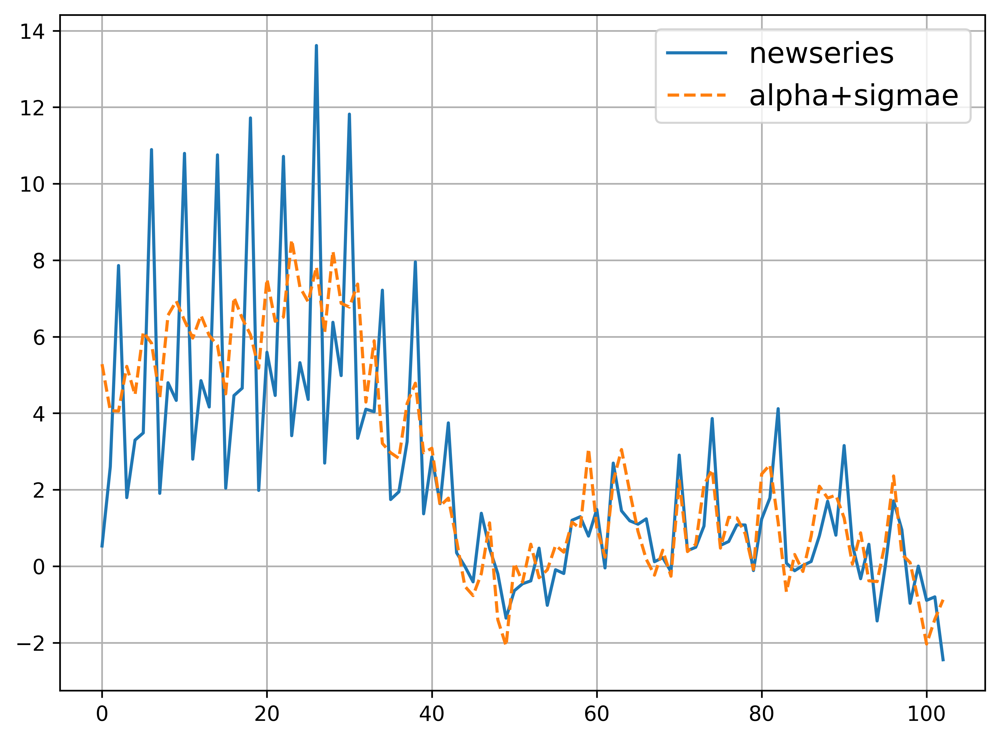

In [94]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(newseries, label="newseries")
plt.plot(alpha+sigmae, '--', label="alpha+sigmae")
plt.legend(fontsize=14)
plt.grid()
plt.show()


# Seasonal-state-Space representation

In [159]:
import numpy as np

np.random.seed(55)
n = 100
sigmae = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
s = 4
gamma = 0.3
sfactor = 10 * np.random.randn(s)
for i in range(4):
    y.append(sfactor[i]+sigmae[i])
    alpha.append(sfactor[i] + 0.2 * sigmae[i])
for t in range(4,n):
    alpha.append(alpha[t-s] + gamma * sigmae[t])
    y.append(alpha[t-s]+sigmae[t])

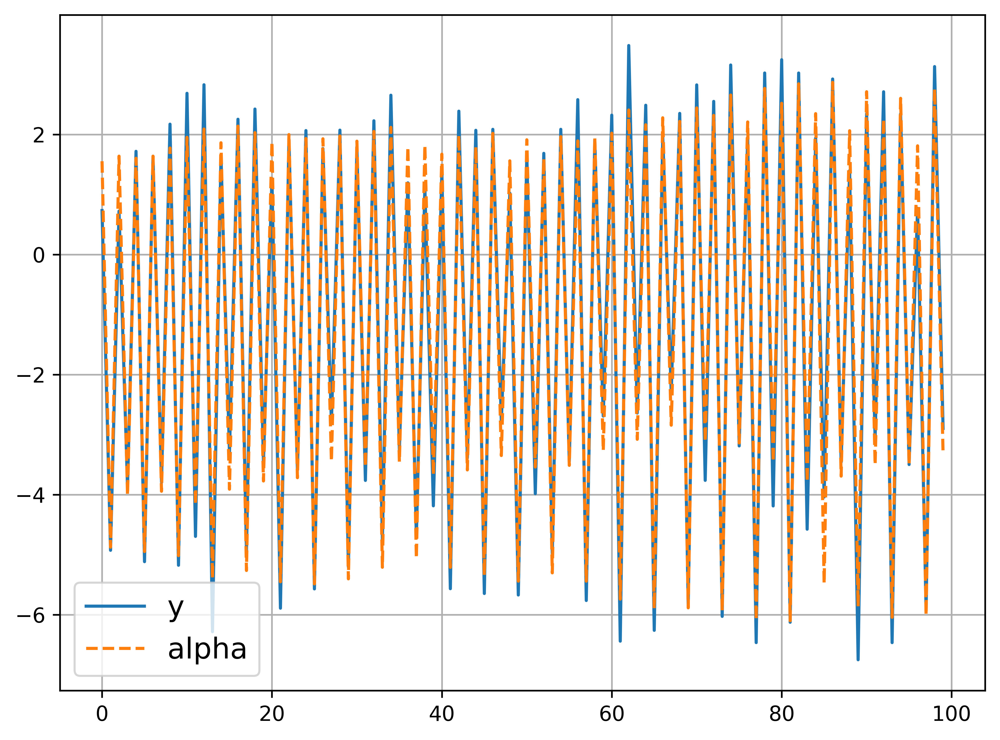

In [160]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, '--', label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

In [162]:
import numpy as np

np.random.seed(55)
n = 12000
sigmae = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
s = 4
gamma = 0.3
sfactor = 10 * np.random.randn(s)
for i in range(4):
    y.append(sfactor[i]+sigmae[i])
    alpha.append(sfactor[i] + 0.2 * sigmae[i])
for t in range(4,n):
    alpha.append(alpha[t-s] + gamma * sigmae[t])
    y.append(alpha[t-s]+sigmae[t])
s = 4
state = np.zeros(n)
e = np.zeros(n)
state[0:3] = y[0:3]

In [163]:
def log_Lik_Conc(params,y):
    gamma = abs(params)
    for t in range(s,n):
        e[t] = y[t]-state[t-s]
        state[t] = state[t-s]+gamma*e[t]
    sum = 0
    for i in range(1,n):
        sum += e[i]*e[i]/(n-1)
    return sum

In [165]:
import pandas as pd
from scipy.optimize import minimize

params = 0.2
res_log_Lik_Conc = minimize(log_Lik_Conc, params, y, method = 'Nelder-Mead')
print(res_log_Lik_Conc)

output_Estmate = pd.Series()
output_Estmate['gamma'] = abs(res_log_Lik_Conc.x[0])

output_True = pd.Series()
output_True['gamma'] = 0.3

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output


 final_simplex: (array([[0.34640625],
       [0.34632813]]), array([0.41230753, 0.41230753]))
           fun: 0.4123075335857137
       message: 'Optimization terminated successfully.'
          nfev: 28
           nit: 14
        status: 0
       success: True
             x: array([0.34640625])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # This is added back by InteractiveShellApp.init_path()


,Estimate Param,Ture Param
gamma,0.346406,0.3


## Suppose we want to generate a local level with drift (the model underlying the Theta method)np.random.seed(1132)

In [166]:
import numpy as np

np.random.seed(1132)
n = 100
sigmae = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
s = 4
co = 0.3
sfactor = 10 * np.random.rand(s)

for i in range(4):
    y.append(sfactor[i] + sigmae[i])
    alpha.append(sfactor[i] + sigmae[i])

for t in range(4,n):
    alpha.append(co + alpha[t-s] + 0.1 * sigmae[t])
    y.append(alpha[t - s] + sigmae[t])

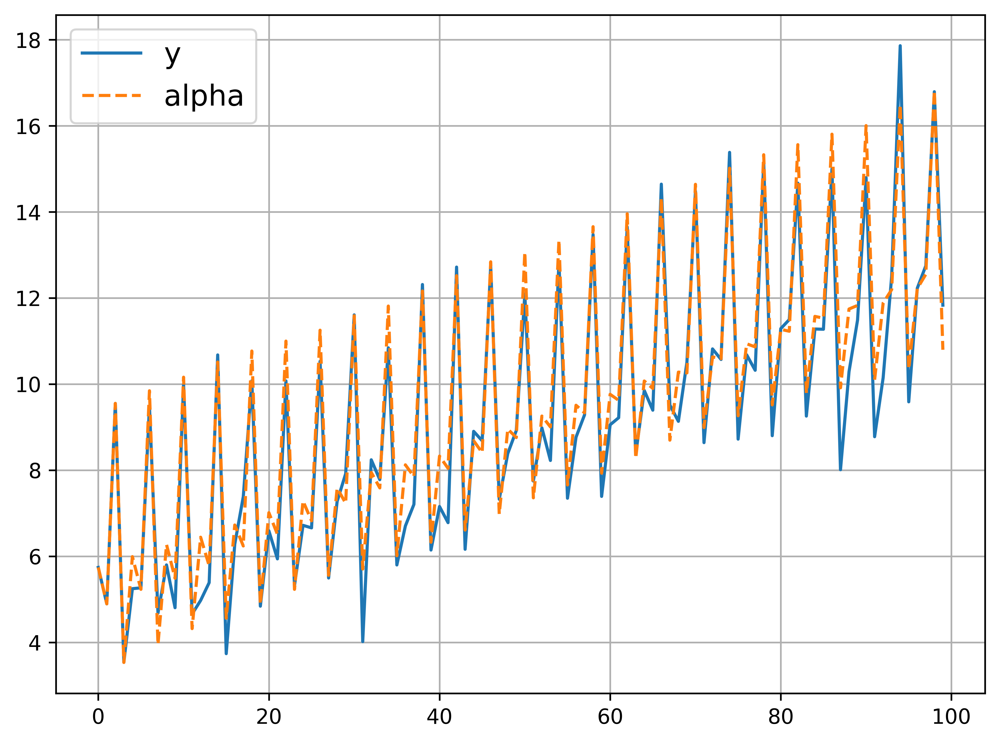

In [167]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, '--', label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

In [168]:
np.random.seed(1132)
n = 12000
sigmae = np.sqrt(0.4)*np.random.randn(n)
y = []
alpha = []
s = 4
co = 0.3
sfactor = 10*np.random.rand(s)
for i in range(4):
    y.append(sfactor[i]+sigmae[i])
    alpha.append(sfactor[i]+sigmae[i])
for t in range(4,n):
    alpha.append(co+alpha[t-s]+0.1*sigmae[t])
    y.append(alpha[t-s]+sigmae[t])

In [169]:
def log_Lik_Conc(params,y,s):
    gamma = abs(params[0])
    co = abs(params[1])
    state = np.zeros(n)
    e = np.zeros(n)
    state[0:3] = y[0:3]
    for t in range(s,n):
        e[t] = y[t]-state[t-s]
        state[t] = co+state[t-s]+gamma*e[t]
    sum = 0
    for i in range(1,n):
        sum+=e[i]*e[i]/(n-1)
    return sum

In [170]:
import pandas as pd
from scipy.optimize import minimize

s = 4
gamma = 0.1
co = 0.3
params = [gamma, co]
res_log_Lik_Conc = minimize(fun = log_Lik_Conc,
                            x0 = params,
                            args = (y, s),
                            method = 'Nelder-Mead')
print(res_log_Lik_Conc)

output_Estmate = pd.Series()
output_Estmate['gamma'] = abs(res_log_Lik_Conc.x[0])
output_Estmate['const'] = abs(res_log_Lik_Conc.x[1])

output_True = pd.Series()
output_True['gamma'] = 0.1
output_True['const'] = 0.3

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output



 final_simplex: (array([[0.10391145, 0.30089203],
       [0.10399237, 0.30089611],
       [0.10394168, 0.30086527]]), array([0.40314089, 0.4031409 , 0.40314092]))
           fun: 0.4031408864134758
       message: 'Optimization terminated successfully.'
          nfev: 35
           nit: 18
        status: 0
       success: True
             x: array([0.10391145, 0.30089203])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:18: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
gamma,0.103911,0.1
const,0.300892,0.3


# Forecasting time series
## generate the series

In [171]:
import numpy as np
np.random.seed(1347)
n = 105
sigmae = np.sqrt(0.5)*np.random.randn(n)
sigmau = np.sqrt(0.1)*np.random.randn(n)
y = [sigmae[0]]
alpha = [sigmau[0]]
co = 0.06
for t in range(1,n):
    alpha.append(co+alpha[t-1]+sigmau[t])
    y.append(alpha[t-1]+sigmae[t])

## plot the series

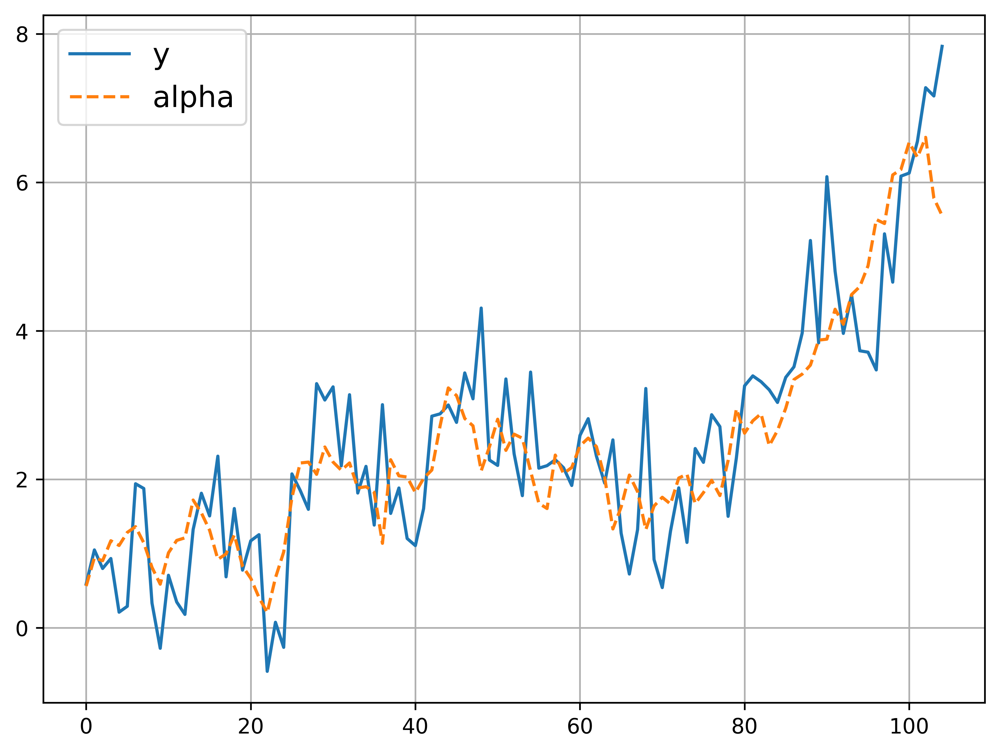

In [172]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y, label="y")
plt.plot(alpha, '--', label="alpha")
plt.legend(fontsize=14)
plt.grid()
plt.show()

## generate long series

In [173]:
import numpy as np
np.random.seed(1347)
n = 10000+5
sigmae = np.sqrt(0.5)*np.random.randn(n)
sigmau = np.sqrt(0.1)*np.random.randn(n)
y = [sigmae[0]]
alpha = [sigmau[0]]
co = 0.06
for t in range(1,n):
    alpha.append(co+alpha[t-1]+sigmau[t])
    y.append(alpha[t-1]+sigmae[t])

## estimate param

In [174]:
def func_Theta(params, y, n):
    q = abs(params[0])
    co = abs(params[1])
    z = 1
    w = 1
    obs = n
    sigmae = 0
    likelihood = 0
    x = y[0:obs]
    a = [x[0]]
    p = [10000]
    k = [0]
    v = [0]
    for t in range(1, obs):
        k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
        p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(x[t] - z * a[t - 1])
        a.append(co + w * a[t - 1] + k[t] * v[t])
        sigmae += (v[t] * v[t]) / (z * z * p[t - 1] + 1)
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
            0.5 * np.log(z * z * p[t - 1] + 1)
    likelihood += 0.5 * n * np.log(sigmae / n)
    return likelihood

In [175]:
import pandas as pd
from scipy.optimize import minimize

q = 0.2
co = 0.1
params = [q,co]
res_func_Theta = minimize(fun=func_Theta,
                          x0= params,
                          args=(y,10000),
                          method = 'Nelder-Mead')
print(res_func_Theta)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_func_Theta.x[0])
output_Estmate['const'] = abs(res_func_Theta.x[1])

output_True = pd.Series()
output_True['q'] = 0.2
output_True['const'] = 0.1

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.21249589, 0.06179446],
       [0.21239865, 0.06181234],
       [0.21255947, 0.06181416]]), array([12912.5930174 , 12912.59303842, 12912.59304649]))
           fun: 12912.593017404506
       message: 'Optimization terminated successfully.'
          nfev: 59
           nit: 31
        status: 0
       success: True
             x: array([0.21249589, 0.06179446])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  del sys.path[0]
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
q,0.212496,0.2
const,0.061794,0.1


In [177]:
q = res_func_Theta.x[0]
co = res_func_Theta.x[1]
obs = 10000
x = y[0:obs]
a = [x[0]]
p = [10000]
k = [0]
v = [0]
z = 1
w = 1
sigmae = 0

for t in range(1, obs):
    k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
    p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
    v.append(y[t] - z * a[t - 1])
    a.append(co + w * a[t - 1] + k[t] * v[t])
    sigmae += v[t] * v[t] / (z * z * p[t] + 1)
sigmae_estimated = sigmae / (obs - 1)
sigmau_estimated = q * sigmae_estimated

output_Estmate = pd.Series()
output_Estmate['sigmae'] = sigmae_estimated
output_Estmate['sigmau'] = sigmau_estimated

output_True = pd.Series()
output_True['sigmae'] = 0.5
output_True['sigmau'] = 0.1

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:26: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
sigmae,0.490258,0.5
sigmau,0.104178,0.1


## Forecast

In [178]:
MyForecasts = np.zeros(5)
MyForecasts[0] = a[obs-1]
MyForecasts[1] = co + MyForecasts[0]
MyForecasts[2] = co + MyForecasts[1]
MyForecasts[3] = co + MyForecasts[2]
MyForecasts[4] = co + MyForecasts[3]

## plot forecasted series

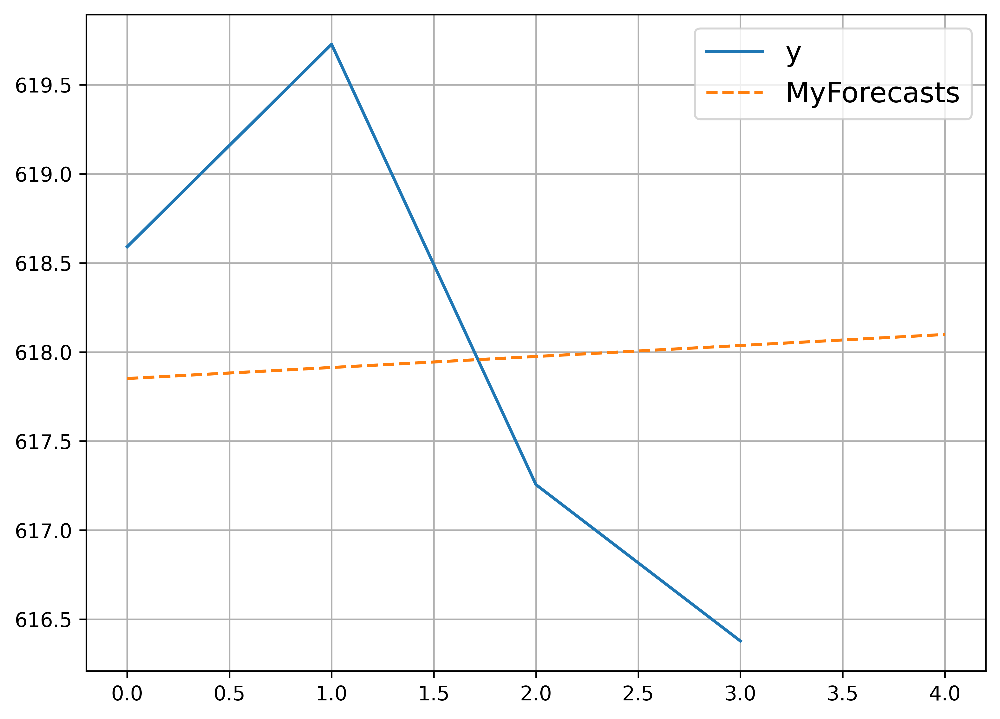

In [179]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6), dpi=600)
plt.plot(y[10000:10004], label="y")
plt.plot(MyForecasts, '--', label="MyForecasts")
plt.legend(fontsize=14)
plt.grid()
plt.show()


# Forecasting seasonal series
Now consider the case of series affected by a seasonal factor. Suppose we wish to forecast the last 6 observations of this series (considering that we know only the first 100 observations):

In [247]:
import numpy as np

np.random.seed(4241)
n = 1293
h = 6
e = np.sqrt(0.4)*np.random.randn(n)
u = np.sqrt(0.1)*np.random.randn(n)
my = np.zeros(n)
alpha = np.zeros(n)
con = 0.03
factor = [0.3,0.9,1.3,1.5]
seasonal = list()
for i in range(n):
    seasonal.append(factor[i%4])
my[0] = e[0]
alpha[0] = u[0]
for t in range(1,n):
    my[t] = seasonal[t] * (alpha[t-1] + e[t])
    alpha[t] = con + alpha[t-1]+u[t]

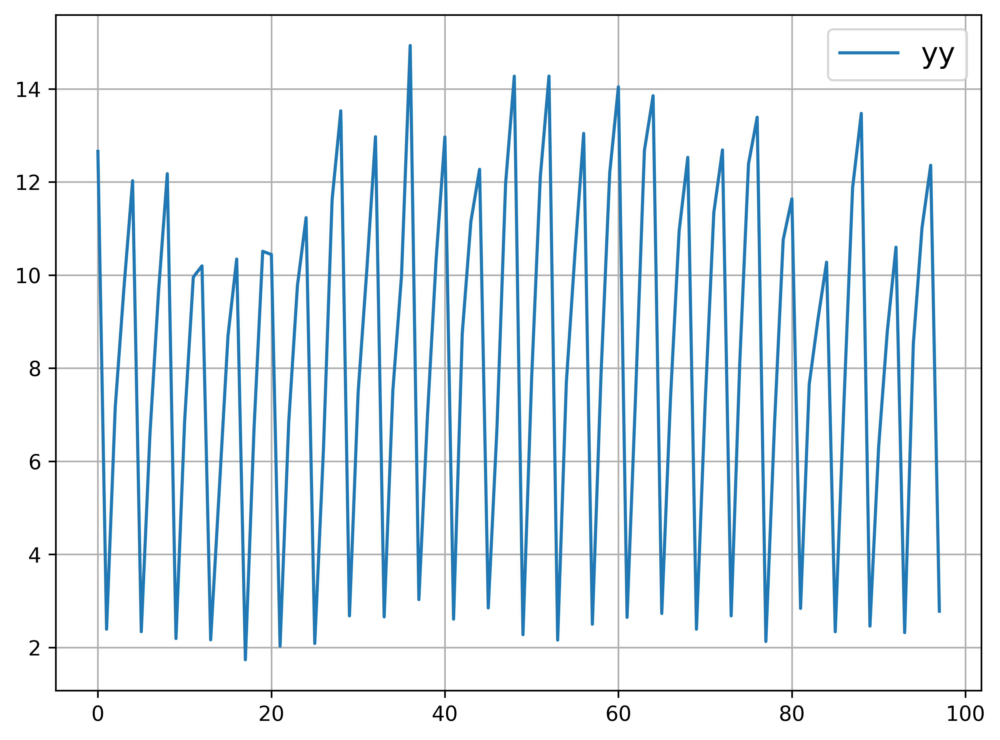

In [248]:
import matplotlib.pyplot as plt

yy = my[299:397]
plt.figure(figsize=(8, 6), dpi=600)
plt.plot(yy, label="yy")
plt.legend(fontsize=14)
plt.grid()
plt.show()

In this example we suppose we know the first 100 observations and we leave the other 6 as forecasting sample.

In [249]:
y = my[0:(len(my)-h)-1]
s = 4
n = len(y)
w = []
for i in range(s+1):
    w.append(1/(2*s))
for i in range(1,s):
    w[i] = 1/s
cma = np.zeros(len(y))
for g in range(len(y)-s):
    for i in range(s+1):
        cma[int(g+s/2)] += w[i]*y[g+i]
residuals = y/cma
factors = []
for seas in range(s):
    num = seas
    temp = []
    while num<(len(y)-1):
        if (num<2 or num>(len(y)-3)):
            num+=4
            continue
        else:
            temp.append(residuals[num])
            num+=4
    factors.append(np.mean(temp))
sfactors = [i*4/sum(factors) for i in factors]
newseries = []
for i in range(n):
    newseries.append(y[i]/sfactors[i%s])

c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]


We can now forecast the newly deseasonalised series and then multiply the forecast by the factors to obtain
the seasonal forecasts. The code below makes the trick:

In [250]:
def funcTheta(params, newseries):
    q = abs(params[0])
    co = abs(params[1])
    n = len(newseries)
    a = [newseries[0]]
    p = [10000]
    k = [0]
    v = [0]
    z = 1
    w = 1
    sigmae = 0
    likelihood = 0
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
        p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(newseries[t] - z * a[t - 1])
        a.append(co + w * a[t - 1] + k[t] * v[t])
        sigmae += (v[t] * v[t]) / (z * z * p[t - 1] + 1)
        likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
            0.5 * np.log(z * z * p[t - 1] + 1)
    likelihood += 0.5 * n * np.log(sigmae / n)
    return likelihood

In [251]:
import pandas as pd
from scipy.optimize import minimize

q = 0.25
co = 0.03
param = [q, co]
res_funcTheta = minimize(fun = funcTheta,
                         x0 = param,
                         args = newseries,
                         method = 'Nelder-Mead')
print(res_funcTheta)

output_Estmate = pd.Series()
output_Estmate['q'] = abs(res_funcTheta.x[0])
output_Estmate['co'] = abs(res_funcTheta.x[1])

output_True = pd.Series()
output_True['q'] = 0.25
output_True['co'] = 0.03


output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

 final_simplex: (array([[0.26242332, 0.0373685 ],
       [0.2623403 , 0.03738847],
       [0.26245285, 0.03738896]]), array([1577.11001542, 1577.1100155 , 1577.11001712]))
           fun: 1577.1100154184464
       message: 'Optimization terminated successfully.'
          nfev: 40
           nit: 20
        status: 0
       success: True
             x: array([0.26242332, 0.0373685 ])


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  del sys.path[0]
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
q,0.262423,0.25
co,0.037368,0.03


In [252]:
q = res_funcTheta.x[0]
co = res_funcTheta.x[1]
n = len(newseries)
a = [newseries[0]]
p = [10000]
k = [0]
v = [0]
z = 1
w = 1
sigmae = 0
for t in range(1, n):
    k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
    p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
    v.append(newseries[t] - z * a[t - 1])
    a.append(co + w * a[t - 1] + k[t] * v[t])
    sigmae += v[t] * v[t] / (z * z * p[t] + 1)
sigmae_estimated = sigmae / (n - 1)
sigmau_estimated = q * sigmae_estimated
print(sigmae_estimated)
print(sigmau_estimated)

output_Estmate = pd.Series()
output_Estmate['sigmae'] = sigmae_estimated
output_Estmate['sigmau'] = sigmau_estimated

output_True = pd.Series()
output_True['sigmae'] = 0.4
output_True['sigmau'] = 0.1

output = pd.DataFrame()
output['Estimate Param'] = output_Estmate
output['Ture Param'] = output_True
output

0.40975379056843075
0.10752894831877301


c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:26: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


,Estimate Param,Ture Param
sigmae,0.409754,0.4
sigmau,0.107529,0.1


In [253]:
sfactnh = []
for i in range(n+h):
    sfactnh.append(sfactors[i%s])
sfactout = sfactnh[(len(sfactnh)-h):len(sfactnh)]
w = 1
z = 1
MyForecasts = np.zeros(h)
MyForecasts[0] = a[len(newseries)-1]
for o in range(1,h):
    MyForecasts[o] = co+MyForecasts[o-1]
SeasonalForecast = MyForecasts*sfactout

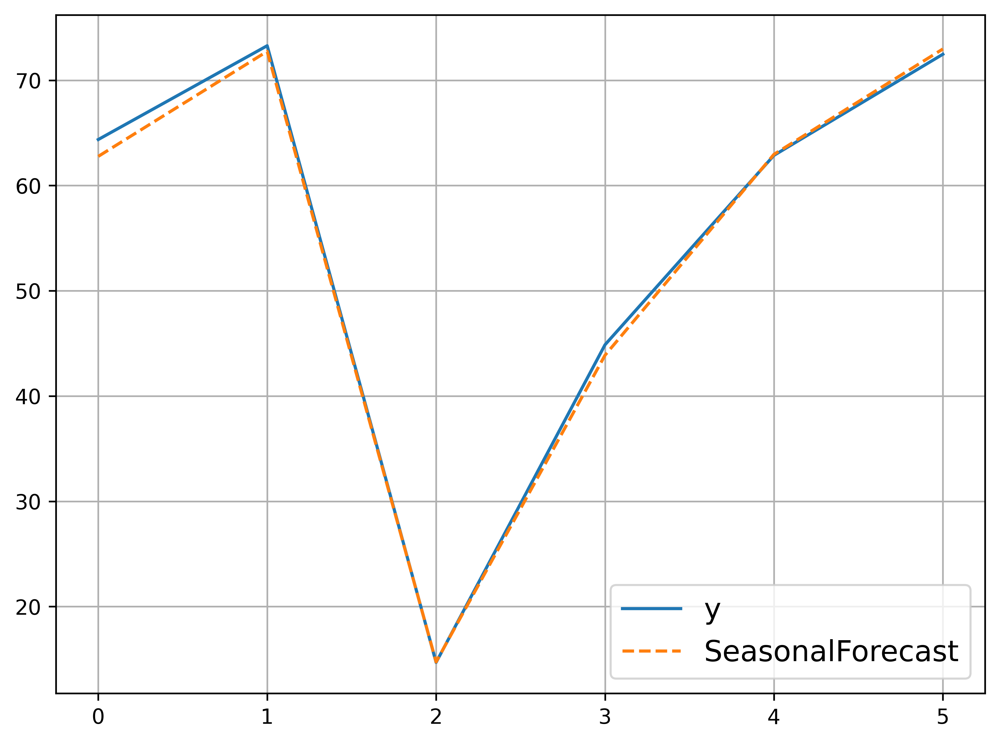

In [255]:
import matplotlib.pyplot as plt
new_y = my[(len(my)-h)-1:len(my)-1]
plt.figure(figsize=(8, 6), dpi=600)
plt.plot(new_y, label="y")
plt.plot(SeasonalForecast, '--', label="SeasonalForecast")
plt.legend(fontsize=14)
plt.grid()
plt.show()

# Comparing forecasting performance

# Forecast competion in action!
## ForecastARkf

In [4]:
import numpy as np
    
def ForecastARkf(y,h):
    def fu(mypa, y):
        q = abs(mypa[0])
        co = abs(mypa[1])
        w = 1-np.exp(-abs(mypa[2]))
        n = len(y)
        a = [y[0]]
        p = [10000]
        k = [0]
        v = [0]
        likelihood = 0
        sigmae = 0
        z = 1
        for t in range(1, n):
            k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
            p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
            v.append(y[t] - z * a[t - 1])
            a.append(co + w * a[t - 1] + k[t] * v[t])
            sigmae += v[t] * v[t] / (z * z * p[t - 1] + 1)
            likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
                0.5 * np.log(z * z * p[t - 1] + 1)
        likelihood += 0.5 * n * np.log(sigmae / n)
        return likelihood
    q = 0.5
    co = 0.2
    w = 0.7
    param = [q,co,w]
    estimation = minimize(fun = fu,
                          x0 = param,
                          args = y,
                          method = 'Nelder-Mead')
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    z = 1
    q = abs(estimation.x[0])
    co = abs(estimation.x[1])
    w = 1 - np.exp(-abs(estimation.x[2]))
    sigmae = 0
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
        p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(y[t] - z * a[t - 1])
        a.append(co + w * a[t - 1] + k[t] * v[t])
        sigmae += v[t] * v[t] / (z * z * p[t - 1] + 1)
    Forec = []
    Forec.append(a[len(y) - 1])
    for i in range(1, h):
        Forec.append(co + w * Forec[i - 1])
    return Forec

## ForecastAR

In [5]:
def ForecastAR(y, h):
    def logLikConc(myparam, y):
        w = 1 - np.exp(-abs(myparam[0]))
        gamma = abs(myparam[1])
        co = abs(myparam[2])
        state = [y[0]]
        v = [0]
        result = 0
        for t in range(1, len(y)):
            v.append(y[t] - state[t - 1])
            state.append(co + w * state[t - 1] + gamma * v[t])
            result += v[t] * v[t]
        return result
    w = 10
    gamma = 0.3
    co = 0.8
    params = [w, gamma, co]
    estimation = minimize(fun=logLikConc,
                          x0=params,
                          args=y,
                          method='Nelder-Mead')
    w = 1 - np.exp(-abs(estimation.x[0]))
    gamma = abs(estimation.x[1])
    co = abs(estimation.x[2])
    state = [y[0]]
    v = [0]
    for t in range(1, len(y)):
        v.append(y[t] - state[t - 1])
        state.append(co + w * state[t - 1] + gamma * v[t])
    Forec = []
    Forec.append(state[len(y) - 1])
    for i in range(1, h):
        Forec.append(co + w * Forec[i - 1])
    return Forec

## ForecastThetakf

In [6]:
def ForecastThetakf(y, h):
    def fu(mypa, y):
        q = abs(mypa[0])
        co = abs(mypa[1])
        w = 1
        n = len(y)
        a = [y[0]]
        p = [10000]
        k = [0]
        v = [0]
        likelihood = 0
        sigmae = 0
        z = 1
        for t in range(1, n):
            k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
            p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
            v.append(y[t] - z * a[t - 1])
            a.append(co + w * a[t - 1] + k[t] * v[t])
            sigmae += v[t] * v[t] / (z * z * p[t - 1] + 1)
            likelihood += 0.5 * np.log(2 * np.pi) + 0.5 + \
                0.5 * np.log(z * z * p[t - 1] + 1)
        likelihood += 0.5 * n * np.log(sigmae / n)
        return likelihood
    q = 0.5
    co = 0.1
    param = [q,co]
    estimation = minimize(fun=fu,
                          x0 = param,
                          args = y,
                          method = 'Nelder-Mead')
    n = len(y)
    a = [y[0]]
    p = [10000]
    k = [0]
    v = [0]
    z = 1
    q = abs(estimation.x[0])
    co = abs(estimation.x[1])
    w = 1
    for t in range(1, n):
        k.append((z * w * p[t - 1]) / (z * z * p[t - 1] + 1))
        p.append(w * w * p[t - 1] - w * z * k[t] * p[t - 1] + q)
        v.append(y[t] - z * a[t - 1])
        a.append(co + w * a[t - 1] + k[t] * v[t])
    Forec = []
    Forec.append(a[len(y) - 1])
    for i in range(1, h):
        Forec.append(co + w * Forec[i - 1])
    return Forec

## ForecastTheta

In [7]:
def ForecastTheta(y, h):
    def logLikConc(myparam, y):
        w = 1
        gamma = abs(myparam[0])
        co = abs(myparam[1])
        state = [y[0]]
        v = [0]
        result = 0
        for t in range(1,len(y)):
            v.append(y[t]-state[t-1])
            state.append(co+w*state[t-1]+gamma*v[t])
            result += v[t]*v[t]
        return result
    gamma = 0.3
    co = 0.8
    params = [gamma, co]
    estimation = minimize(fun=logLikConc,
                          x0 = params,
                          args = y,
                          method = 'Nelder-Mead')
    w = 1
    gamma = abs(estimation.x[0])
    co = abs(estimation.x[1])
    state = [y[0]]
    v = [0]
    for t in range(1,len(y)):
        v.append(y[t]-state[t-1])
        state.append(co+w*state[t-1]+gamma*v[t])
    Forec = []
    Forec.append(state[len(y)-1])
    for i in range(1,h):
        Forec.append(co+w*Forec[i-1])
    return Forec

## ForecastDamped

In [8]:
def ForecastDamped(y,h):
    def fmsoe(params,y):
        k1 = abs(params[0])
        k2 = abs(params[1])
        k3 = abs(params[2])
        obs = len(y)
        damped1 = [y[0]]
        damped2 = [0]
        inn = [0]
        result = 0
        for t in range(1,obs):
            inn.append(y[t]-damped1[t-1]-k3*damped2[t-1])
            damped1.append(damped1[t-1]+k3*damped2[t-1]+k1*inn[t])
            damped2.append(k3*damped2[t-1]+k2*inn[t])
            result += (inn[t]*inn[t])/obs
        return result
    k1 = np.array([0.3])
    k2 = np.array([0.5])
    k3 = np.array([0.5])
    params = [k1,k2,k3]
    estimation = minimize(fun=fmsoe,
                          x0 = params,
                          args = y,
                          method = 'Nelder-Mead')
    obs = len(y)
    damped1 = [y[0]]
    damped2 = [0]
    inn = [0]
    k1 = abs(estimation.x[0])
    k2 = abs(estimation.x[1])
    k3 = abs(estimation.x[2])
    if k3>1:
        k3 = 1
    for t in range(1,obs):
        inn.append(y[t]-damped1[t-1]-k3*damped2[t-1])
        damped1.append(damped1[t-1]+k3*damped2[t-1]+k1*inn[t])
        damped2.append(k3*damped2[t-1]+k2*inn[t])
    Forecast = list()
    Forecast.append(damped1[obs-1]+k3*damped2[obs-1])
    for i in range(1,h):
        Forecast.append(Forecast[i-1]+damped2[obs-1]*pow(k3,i))
    return Forecast

In [1]:
import pandas as pd
filename = 'GOOG.xlsx'
dataset = pd.read_excel(filename).dropna()
dataset

,Unnamed: 0,GOOG.Open,GOOG.High,GOOG.Low,GOOG.Close,GOOG.Volume,GOOG.Adjusted
0,1,232.129913,237.440018,229.694046,232.921951,15470700,232.921951
1,2,233.624313,241.071411,233.300537,240.727692,15834200,240.727692
2,3,240.349106,242.839783,238.162308,242.685349,13795600,242.685349
3,4,242.934418,244.020355,240.199677,240.887100,9544400,240.887100
4,5,241.818604,243.213379,239.701538,241.843506,10803000,241.843506
...,...,...,...,...,...,...,...
3421,3422,1469.300049,1482.410034,1463.459961,1473.609985,1979500,1473.609985
3422,3423,1471.750000,1502.390015,1466.000000,1500.099976,1995400,1500.099976
3423,3424,1500.000000,1516.844971,1481.640015,1494.489990,1576600,1494.489990
3424,3425,1487.180054,1504.074951,1473.079956,1496.099976,1289300,1496.099976


In [10]:
import numpy as np
from scipy.optimize import minimize
np.random.seed(12321)
GOOG = dataset['GOOG.Close']
y = GOOG[0:(len(GOOG)-6)]
mean_value = np.mean(abs(y.diff().dropna()))
y = y.tolist()
true_value = GOOG[(len(GOOG)-6):len(GOOG)]
true_value = true_value.tolist()


In [11]:
functionlist = [ForecastAR,ForecastARkf,ForecastTheta,ForecastThetakf,ForecastDamped]
Forecasts = np.zeros((5,6))
Err = np.zeros((5,6))
sErr = np.zeros((5,6))
steps = 6
for i in range(5):
    Forecasts[i] = functionlist[i](y,steps)
    for j in range(steps):
        Err[i][j] = true_value[j] - Forecasts[i][j]
        sErr[i][j] = Err[i][j] / mean_value
sMASE = np.zeros(5)
for s in range(steps):
    for i in range(5):
        sMASE[i] = np.mean(abs(sErr[i][0:s]))
result = pd.Series()
result['ForecastAR'] = sMASE[0]
result['ForecastARkf'] = sMASE[1]
result['ForecastTheta'] = sMASE[2]
result['ForecastThetakf'] = sMASE[3]
result['ForecastDamped'] = sMASE[4]
result

c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\users\jx_g\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  """


ForecastAR         2.161027
ForecastARkf       2.162504
ForecastTheta      2.161032
ForecastThetakf    2.162504
ForecastDamped     2.478841
dtype: float64

# ForecastAR wins the competition!